In [8]:
import hnswlib
from PIL import Image
from ShufflePatchModel16 import ShufflePatchFeatureExtractor
from VggFeatureExtractor import VggFeatureExtractor
from glob import glob
import random
import numpy as np
import ipyplot
import math
from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth
from itertools import compress

In [9]:
# cnn = VggFeatureExtractor()
cnn = ShufflePatchFeatureExtractor("/Users/racoon/Desktop/rotation_jigsaw_migrated_0710_0.0001_1.9522_43.62.pt")

Loading Weights... /Users/racoon/Desktop/rotation_jigsaw_migrated_0710_0.0001_1.9522_43.62.pt


In [10]:
def extract_windows(frame, pos, window_size):
    windows = np.empty((len(pos), window_size, window_size, 3), dtype=np.uint8)

    for i in range(len(pos)):
        windows[i] = extract_window(frame, pos[i], window_size)

    return windows


def extract_window(frame, pos, window_size):
    half_w = window_size/2.0

    top_left = [int(round(pos[0]-half_w)), int(round(pos[1]-half_w))]
    bottom_right = [top_left[0]+window_size, top_left[1]+window_size]

    return frame[top_left[0]:bottom_right[0], top_left[1]:bottom_right[1]]

0 dataset_100/train/car/46938b4c628ce00e.jpg
len(points) 104



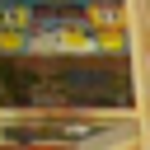
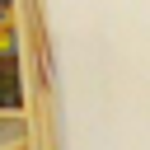
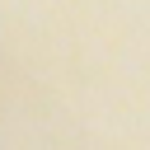
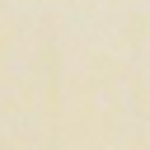
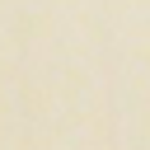
...
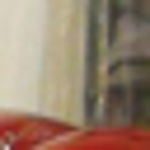
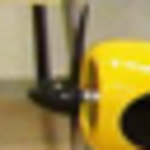
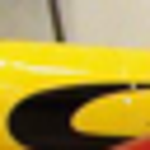
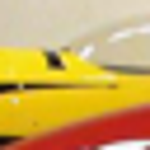
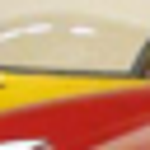

1 dataset_100/train/car/8c4b9d096f6423ed.jpg
len(points) 117



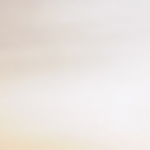
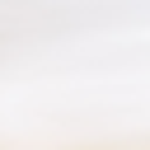
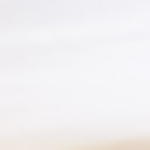
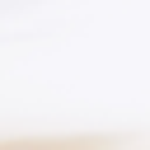
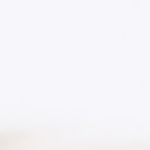
...
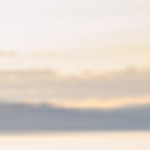
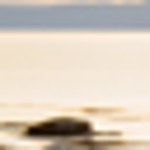
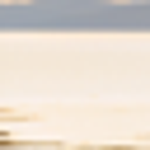
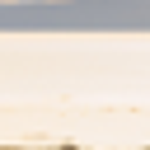
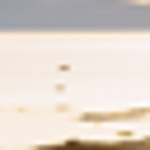

2 dataset_100/train/car/fc418b3caef440aa.jpg
len(points) 130



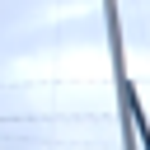
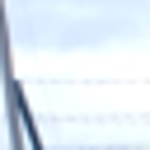
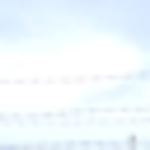
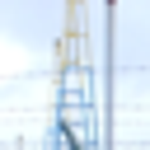
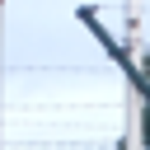
...
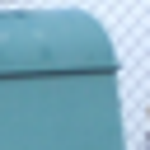
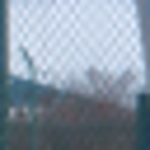
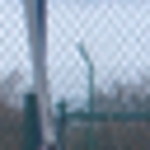
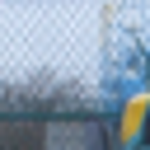
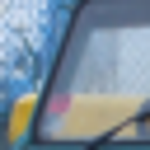

3 dataset_100/train/car/eac45380074ba8c8.jpg
len(points) 130



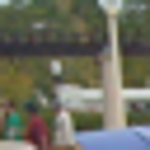
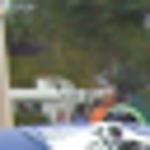
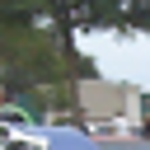
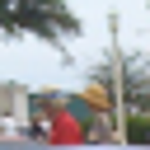
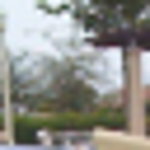
...
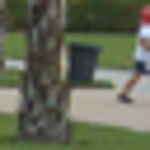
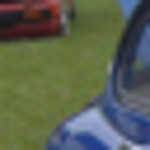
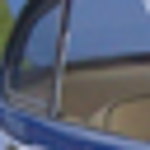
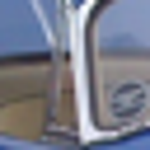
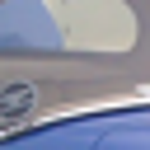

4 dataset_100/train/car/ea9a6d46a1279f85.jpg
len(points) 91



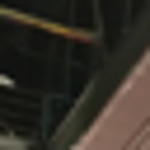
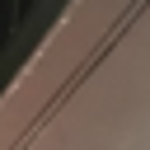
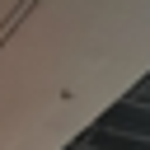
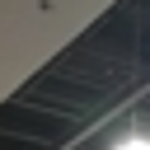
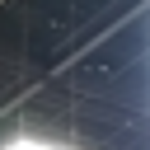
...
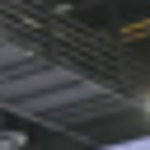
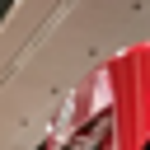
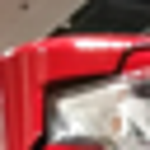
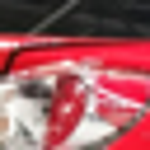
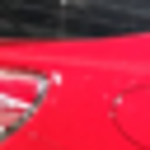

5 dataset_100/train/car/9893ae3d876f9c1c.jpg
len(points) 117



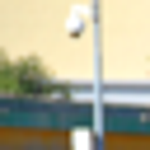
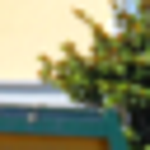
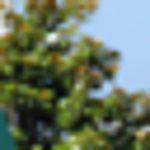
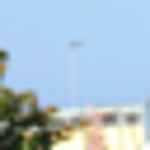
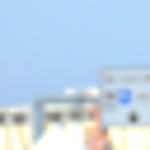
...
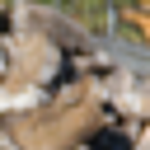
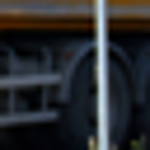
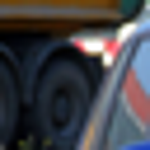
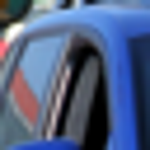
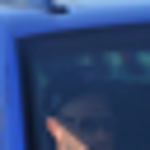

6 dataset_100/train/car/f6b73bb2536fdcb7.jpg
len(points) 169



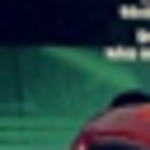
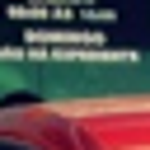
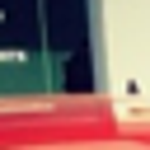
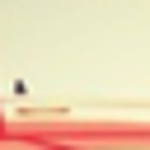
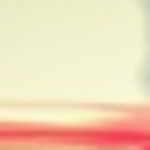
...
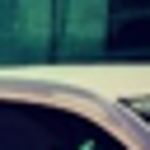
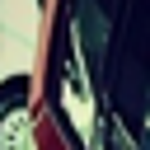
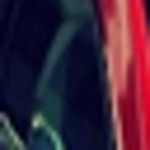
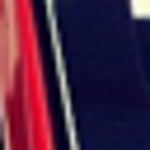
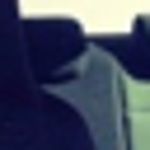

7 dataset_100/train/car/c1ae01ffc0c505f4.jpg
len(points) 130



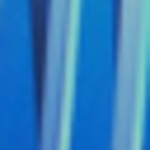
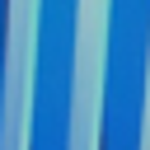
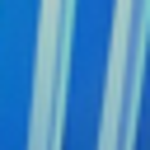
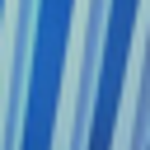
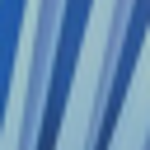
...
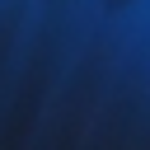
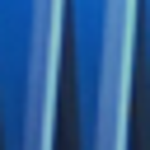
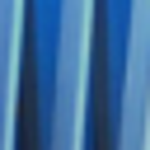
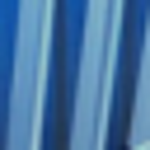
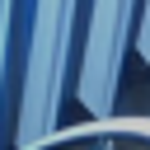

8 dataset_100/train/car/0a41cda5f44baaf6.jpg
len(points) 117



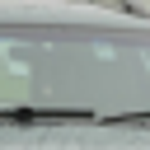
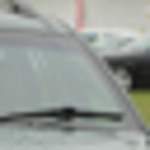
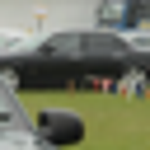
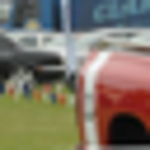
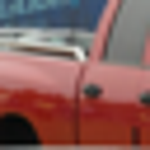
...
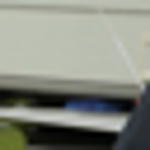
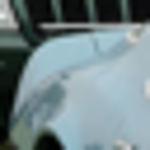
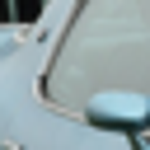
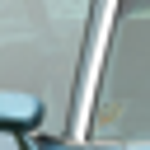
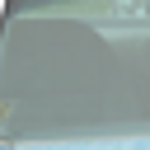

9 dataset_100/train/car/0c9f9b713f229fba.jpg
len(points) 104



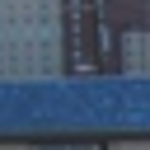
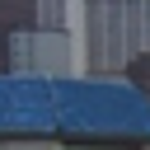
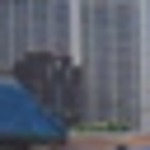
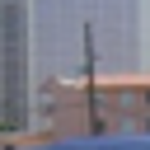
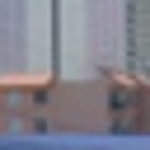
...
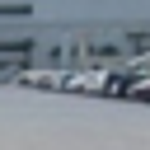
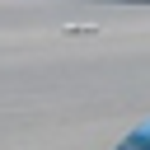
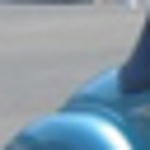
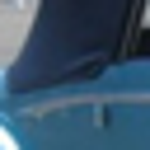
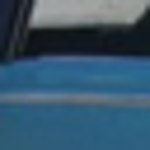

In [11]:
image_files = glob("dataset_100/train/*/*.jpg")

stride = 24
window_size = 32

for idx, image_file in enumerate(image_files[:10]):
    print(idx, image_file)
    pil_image = Image.open(image_file).convert('RGB')
    pil_image = pil_image.resize((int(round(pil_image.size[0]/3)), int(round(pil_image.size[1]/3))))
    image = np.array(pil_image)

    grid = (math.floor((image.shape[0] - (window_size - stride)) / stride), math.floor((image.shape[1] - (window_size - stride)) / stride))
    margin = ((image.shape[0] - grid[0] * stride)/2, (image.shape[1] - grid[1] * stride)/2)
    points = [(margin[0]+y*stride+stride/2,margin[1]+x*stride+stride/2) for y in range(grid[0]) for x in range(grid[1])]
    
    print('len(points)', len(points))
    
    patches = extract_windows(image, points, 32)
    
    windows = patches.astype(np.float64)

    feats = cnn.evalRGB(windows)
    feats = feats.reshape((windows.shape[0], 512))

    ipyplot.plot_images(patches, [np.linalg.norm(f) for f in feats])


In [ ]:
select_count = 10

select_ids = random.sample(patch_dict.keys(), select_count)
#print(select_ids)
select_feats = index.get_items(select_ids)
#print(len(select_feats))
nn_ids, nn_dis = index.knn_query(select_feats, 10)

for i in range(select_count):
    patch = patch_dict.get(select_ids[i])
    nn_patches = [patch_dict.get(q) for q in nn_ids[i]]
    nn_dis_labels = [q for q in nn_dis[i]]

    ipyplot.plot_images([patch], ['patch'])
    ipyplot.plot_images(nn_patches, nn_dis_labels)
